<h1> Scikit-Image in a nutshell </h1> 

Most of times, the datasets available are not suitable for proper training of machine learning methods.
Rather than obtaining a whole new dataset that could perform better on the considered task, the best approach in these kind of situations is to apply some _Image processing_ techniques to transform our dataset in a way that could be more readable by machines.
In this notebook we will follow the following [Tutorial](https://www.kaggle.com/code/bextuychiev/full-tutorial-on-image-processing-in-skimage/notebook) and introduce some of the most common image processing transformations that are available within the SciKit-Image module.

The latter can be installed on the conda environment with:

In [1]:
!conda install -c conda-forge scikit-image

done
Solving environment: done

# All requested packages already installed.



we can check that the installation is successfull by trying to import the module

In [120]:
import skimage as skimg
import skimage.filters as skimg_filt
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import rotate
from skimage.transform import rescale
from skimage.transform import resize
from skimage.filters import try_all_threshold
from skimage.filters import threshold_local
from skimage.exposure import equalize_hist
from skimage.exposure import equalize_adapthist

import sys 
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('seaborn-v0_8-whitegrid')

<h2> Importing images in SK-Image</h2> 

We can import an image to analyze with SK-Image with the following command:

In [3]:
image = imread("./Data/MyCar.jpg")

the image will be imported as a tensor of shape equal to the dimension of the image times the 3 RGB channels.
We can verify its general properties with:

In [7]:
print('The type of the image is :', type(image))
print('The number of dimensions of the image is :', image.ndim)
print('The shape of the image is :', image.shape)
print('The total size of the image is :', image.size)

The type of the image is : <class 'numpy.ndarray'>
The number of dimensions of the image is : 3
The shape of the image is : (1200, 1600, 3)
The total size of the image is : 5760000


The image hence has a dimension equal to 1200*1600!

We can retrieve the various channels of the image by using common numpy slicing, e.g.

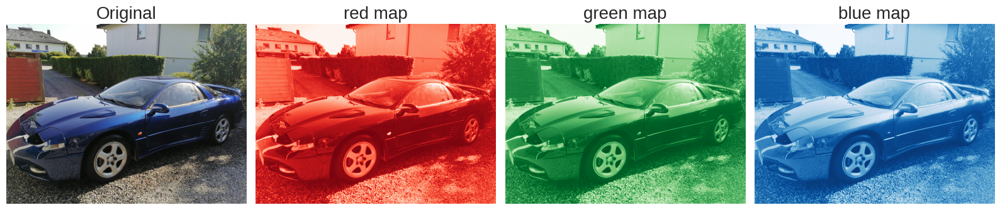

In [27]:
red = image[:, :, 0]
green = image[:, :, 1]
blue = image[:, :, 2]

fig = plt.figure(figsize=(16, 9))

plt.subplot(1,4,1)
plt.axis('off')
plt.imshow(image)
title = "original image"
plt.title('Original', fontsize = 20)

plt.subplot(1,4,2)
plt.axis('off')
plt.imshow(red, cmap ='Reds_r')
plt.title("red map", fontsize = 20)

plt.subplot(1,4,3)
plt.axis('off')
plt.imshow(green, cmap ='Greens_r')
plt.title("green map", fontsize = 20)

plt.subplot(1,4,4)
plt.axis('off')
plt.imshow(blue, cmap ='Blues_r')
plt.title("blue map", fontsize = 20)

plt.tight_layout()
plt.show()

We will now define a function for the following section in order to simplify the plotting process:

In [45]:
def PlotSideBySide(Img, TransImg, cmap_to_apply):
    fig = plt.figure(figsize=(16, 9))

    plt.subplot(1,2,1)
    plt.axis('off')
    plt.imshow(Img)
    plt.title('Original', fontsize = 20)
    plt.subplot(1,2,2)
    plt.axis('off')
    plt.imshow(TransImg, cmap = cmap_to_apply)
    plt.title("Transformed Image", fontsize = 20)

<h2> Hystograms of the colors </h2> 

It's also usefull to plot hystograms of the various color channels. To this extent, we can use the function defined in the [Tutorial](https://www.kaggle.com/code/bextuychiev/full-tutorial-on-image-processing-in-skimage/notebook), which read as follows:

In [48]:
def plot_with_hist_channel(image, channel):
    channels = ["red", "green", "blue"]
    channel_idx = channels.index(channel)
    color = channels[channel_idx]

    extracted_channel = image[:, :, channel_idx]
    fig, (ax1, ax2) = plt.subplots(
        ncols=2, figsize=(18, 6)
    )  # , sharex=True, sharey=True)

    ax1.imshow(image)
    ax1.axis("off")
    ax2.hist(extracted_channel.ravel(), bins=256, color=color) # Setted to 256 as channels normally scale from 0 to 255 max
    ax2.set_title(f"{channels[channel_idx]} histogram")

we can now test that on our image by obtaining:

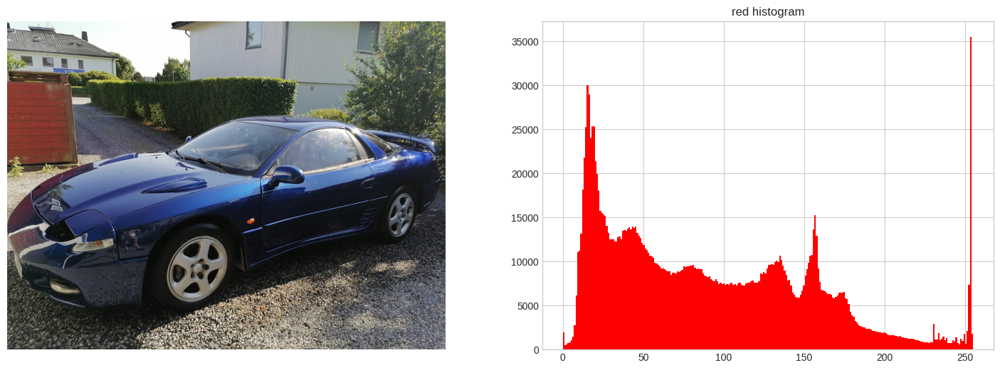

In [49]:
plot_with_hist_channel(image, "red")

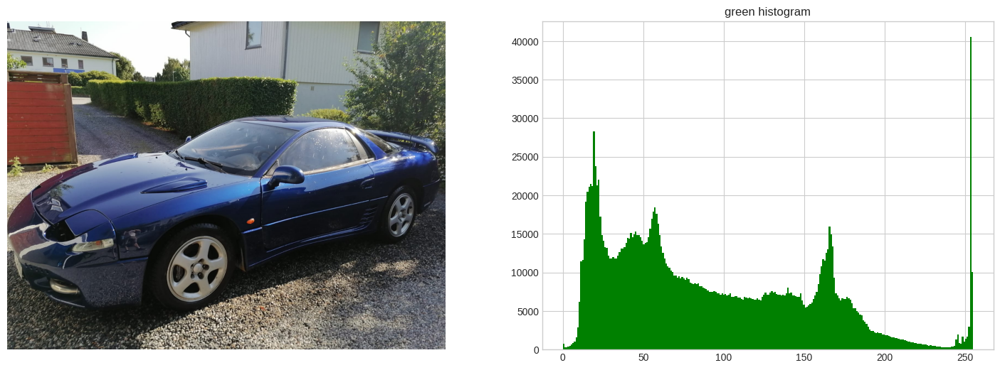

In [50]:
plot_with_hist_channel(image, "green")

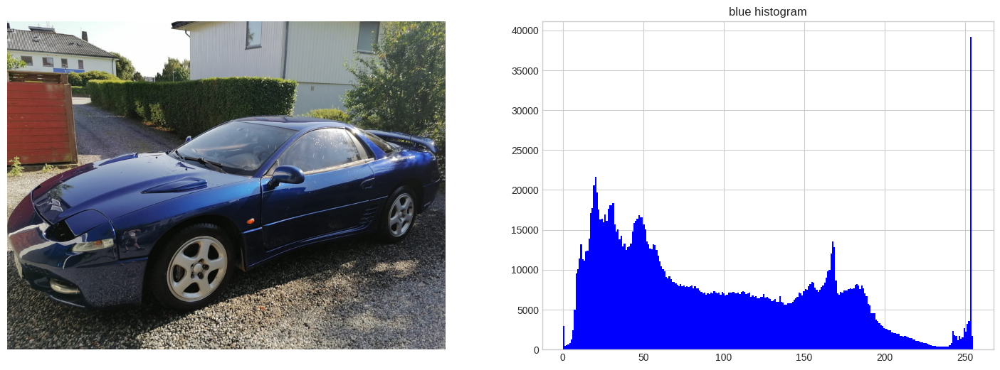

In [51]:
plot_with_hist_channel(image, "blue")

<h2> Common Image transformations</h2> 

We will now present some of the most common transformations that are used in Image Processing.

<h4> Grayscaling </h4>

Grayscaling is particularly usefull as it allows to decrease the dimensionality of the image by converting the 3 RGB channel in a single shade of gray scale.

This process effectively allows to fasten up the computation on the image by just focusing on the features such as the shape of the image.

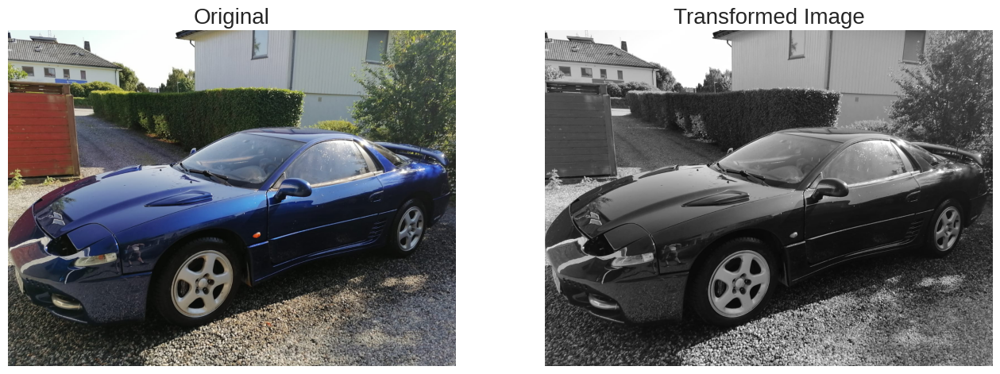

In [32]:
gray = rgb2gray(image)

PlotSideBySide(image, gray, 'gray')

the greyscaled image will reduce the dimensionality as follows:

In [34]:
print('By greyscaling, the shape of the image goes from : ', image.shape, ' to : ', gray.shape)
print('By greyscaling, the total size of the image goes from : ', image.size, ' to : ', gray.size)

By greyscaling, the shape of the image goes from :  (1200, 1600, 3)  to :  (1200, 1600)
By greyscaling, the total size of the image goes from :  5760000  to :  1920000


we can also obtain informations about the image luminosity by plotting the histogram of the greyscaled image:

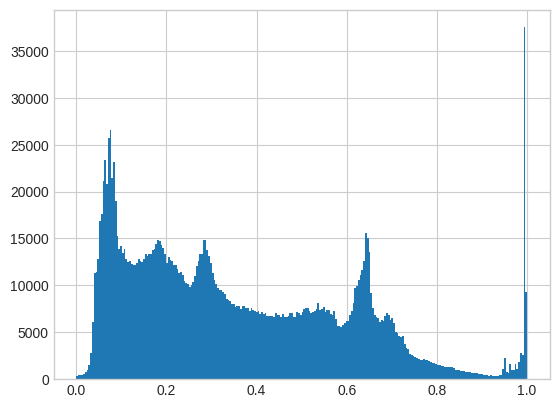

In [52]:
plt.hist(gray.ravel(), bins=256);

<h4> Numpy flips and mirroring </h4>

If we just wish to change the orientation of the image, we can use the simple _Numpy_ methods on arrays.

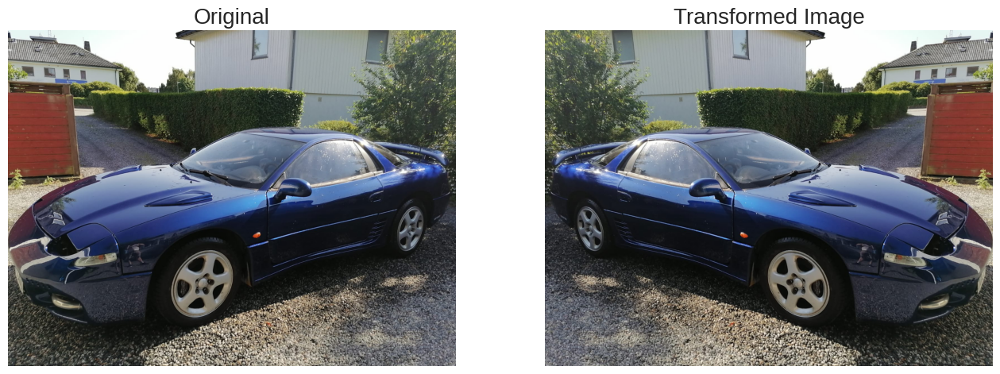

In [46]:
horizontal_flipped = np.fliplr(image)
PlotSideBySide(image, horizontal_flipped, 'viridis')

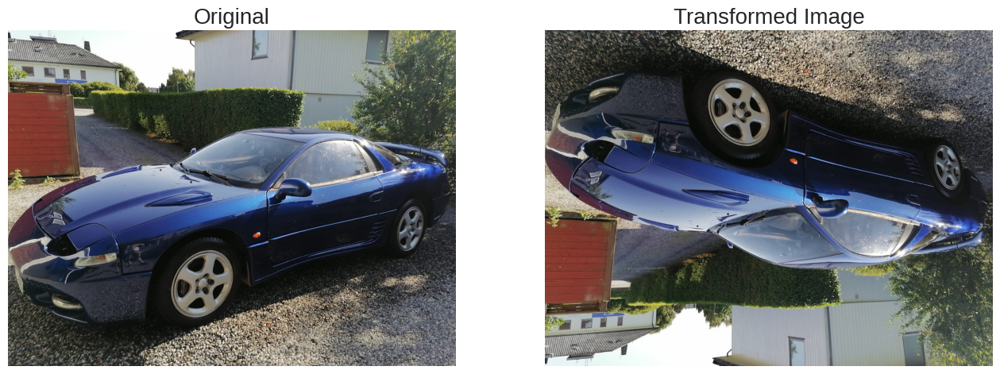

In [47]:
vertically_flipped = np.flipud(image)
PlotSideBySide(image, vertically_flipped, 'viridis')

<h4> Rotations </h4>

To execute rotations, we can use the $rotate$ function from the _transform_ module!

We can execute a rotation as follows:

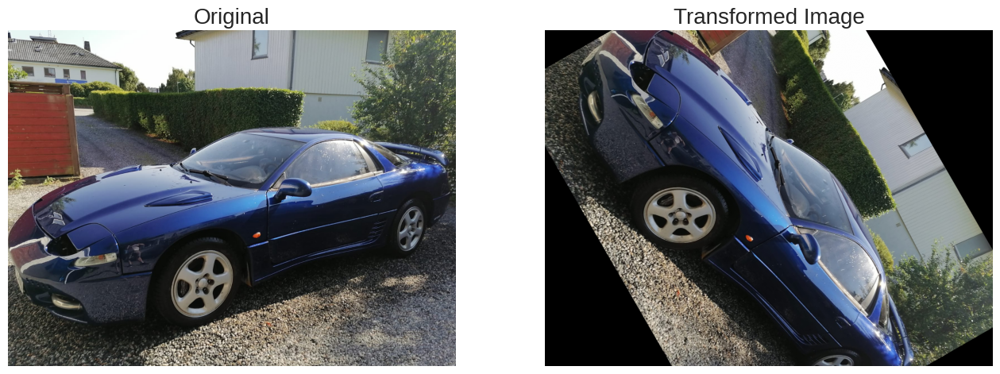

In [109]:
clockwise = rotate(image, angle=-60)
PlotSideBySide(image, clockwise, 'viridis')

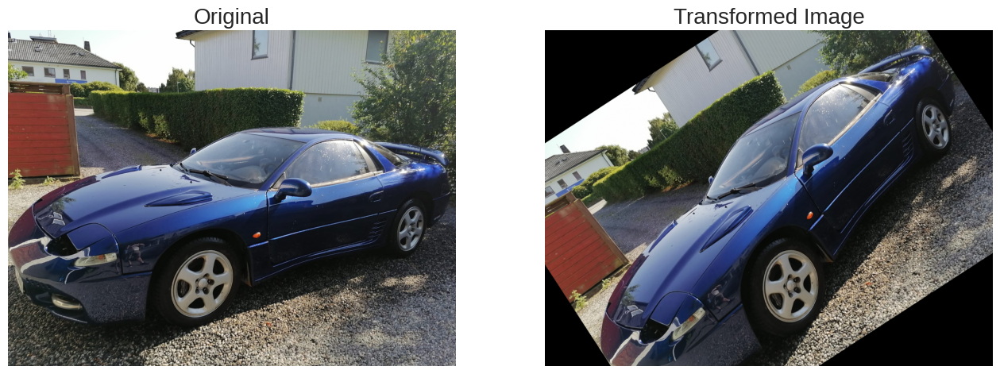

In [110]:
anti_clockwise = rotate(image, angle=33)
PlotSideBySide(image, anti_clockwise, 'viridis')

<h4> Rescaling </h4>

Rescaling is mostly useful in cases where images are proportionally different from one another.

That can be performed with the $rescale$ function, which can be executed as follows:

In [111]:
image.shape

(1200, 1600, 3)

/tmp/ipykernel_101066/3093099556.py:1: FutureWarning: `multichannel` is a deprecated argument name for `rescale`. It will be removed in version 1.0. Please use `channel_axis` instead.
  scaled_image = rescale(image, scale=3 / 4, multichannel=True)


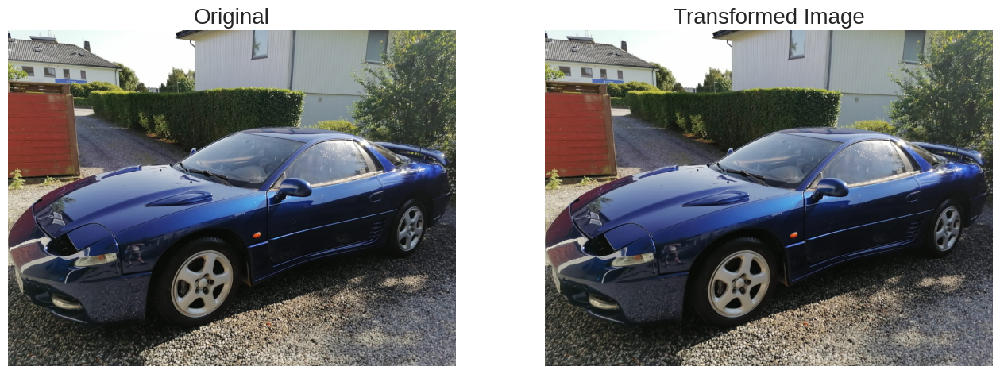

In [114]:
scaled_image = rescale(image, scale=3 / 4, multichannel=True)
PlotSideBySide(image, scaled_image, 'viridis')

the new shape of the image is:

In [115]:
scaled_image.shape

(900, 1200, 3)

Downscaling too much might result in quality loss or pixels rubbing together unceremoniously to create unexpected edges or corners. To account for this effect, you can set $anti\_aliasing$ to True which uses Gaussian smoothing under the hood:

/tmp/ipykernel_101066/682549098.py:1: FutureWarning: `multichannel` is a deprecated argument name for `rescale`. It will be removed in version 1.0. Please use `channel_axis` instead.
  factor_10_aa = rescale(image, scale=1 / 10, multichannel=True, anti_aliasing=True)
/tmp/ipykernel_101066/682549098.py:2: FutureWarning: `multichannel` is a deprecated argument name for `rescale`. It will be removed in version 1.0. Please use `channel_axis` instead.
  factor_10_no_aa = rescale(image, scale=1 / 10, multichannel=True)


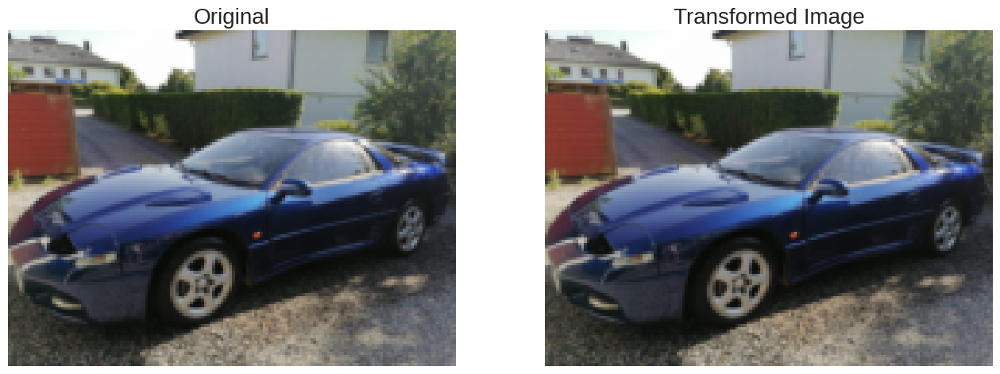

In [125]:
factor_10_aa = rescale(image, scale=1 / 10, multichannel=True, anti_aliasing=True)
factor_10_no_aa = rescale(image, scale=1 / 10, multichannel=True)

PlotSideBySide(factor_10_aa, factor_10_no_aa, 'viridis')

<h4> Resizing </h4>

When we want the image to have specific width and height, rather than scaling it by a factor, we can use the $resize$ function by providing an $output\_shape$:

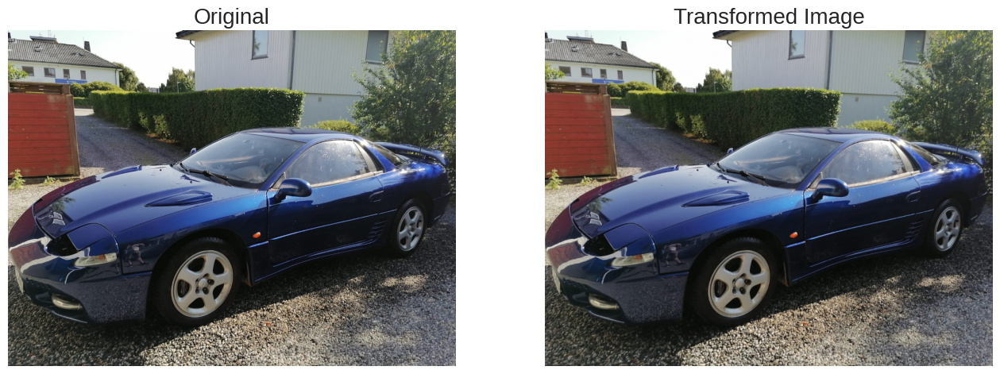

In [126]:
Image_600_800 = resize(image, output_shape=(600, 800))

PlotSideBySide(image, Image_600_800, 'viridis')

the new size will be:

In [129]:
Image_600_800.shape

(600, 800, 3)

<h2> Filters </h2> 

Filters could greatly improve the performance of the trained algorithms, as they allow to remove from the images the features that are deceiving for the planned analysis.

We will hence describe some of the most common filters used in image processing.

<h4> Manual Tresholding </h4>

Thresholding has many applications in image segmentation, object detection, finding edges or contours, etc. It is mostly used to differentiate the background and foreground of an image.

Thresholding works best on high contrast grayscale images, so we will work on the grayscaled image. To apply a manual tresholding, we first need to understand some properties of the image:

In [55]:
print('The mean of the image is : ',gray.mean())
print('The max of the image is : ',gray.max())

The mean of the image is :  0.3619521536170347
The max of the image is :  1.0


this values are needed to understand what would be a suitable treshold for the image.
We can now convert the value in black and white by putting a value that is average between the mean and the max value of the array, normalized at 1.

If the treshold works fine, we will convert the image in black and white:

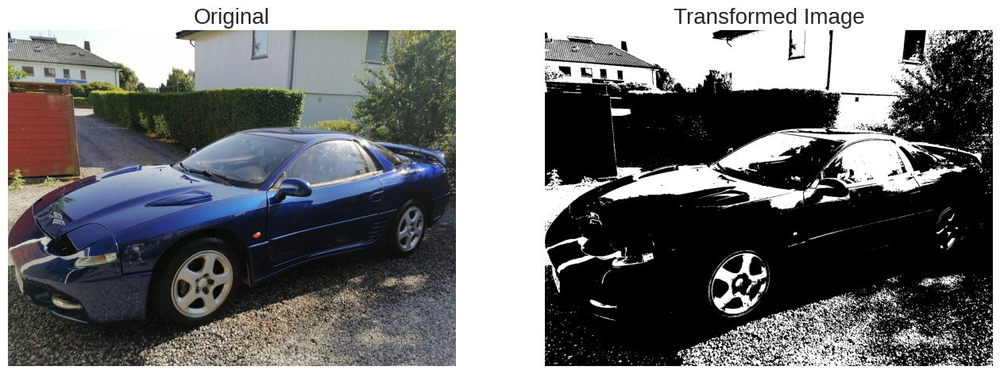

In [67]:
# Set threshold
threshold = 0.5
# Binarize
binary_image = gray > threshold

PlotSideBySide(image, binary_image, "gray")

we can also reverse the image such that the background will become white and viceversa:

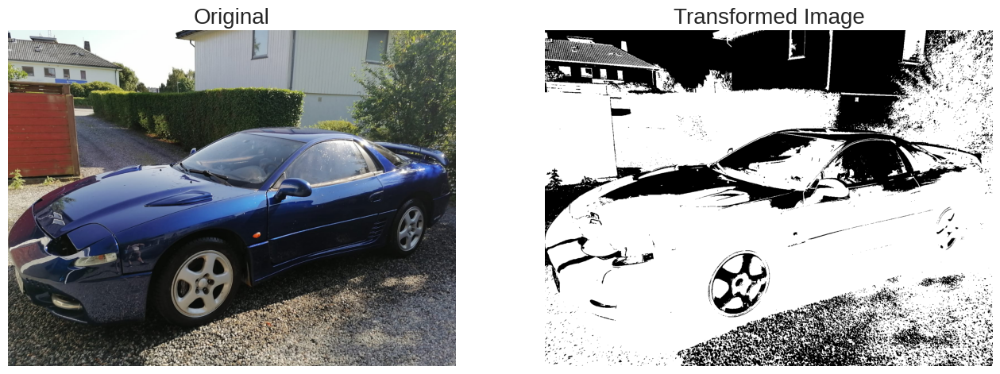

In [69]:
inverted_binary = gray <= threshold

PlotSideBySide(image, inverted_binary, "gray")

<h4> Global Tresholding </h4>

Generally, instead of trying several values for the treshold, it is more convenient to use pre-implemented algorithms.

_SciKit-Image_ has for example the pre-implemented $try\_all\_threshold$, which works as follows: 

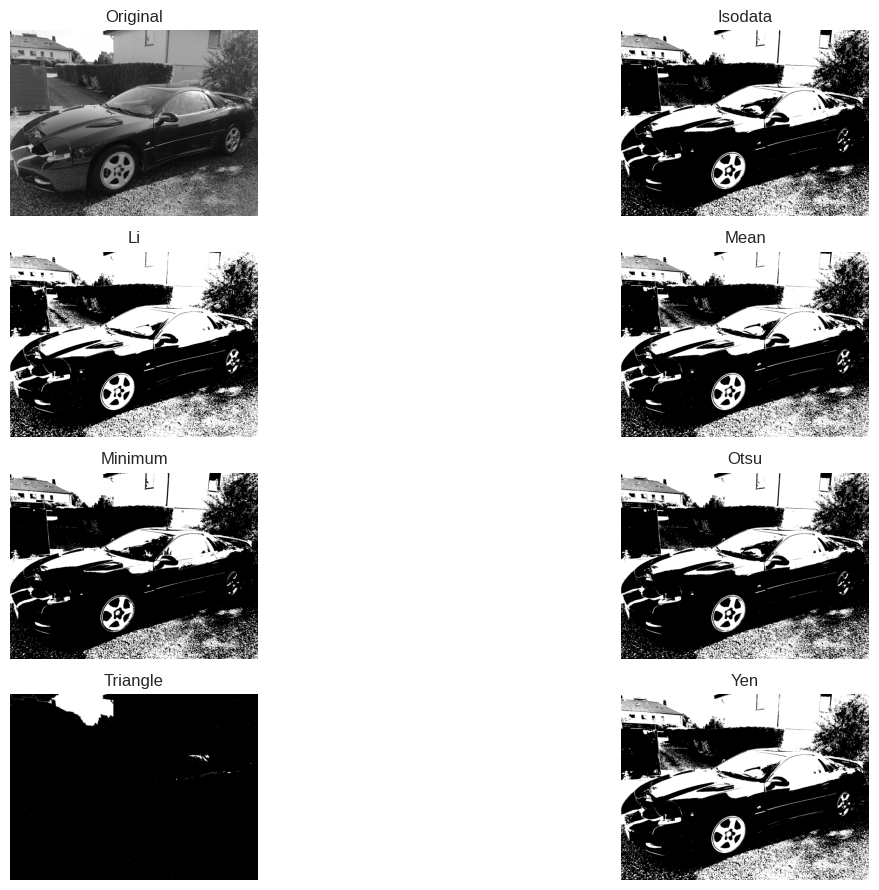

In [74]:
fig, ax = try_all_threshold(gray, figsize=(16, 9), verbose=False)

We hence obtained 7 different filters applying different treshold on the image.

Several filters seems to work properly, we will use from now on the Otsu, which can be used as follows:

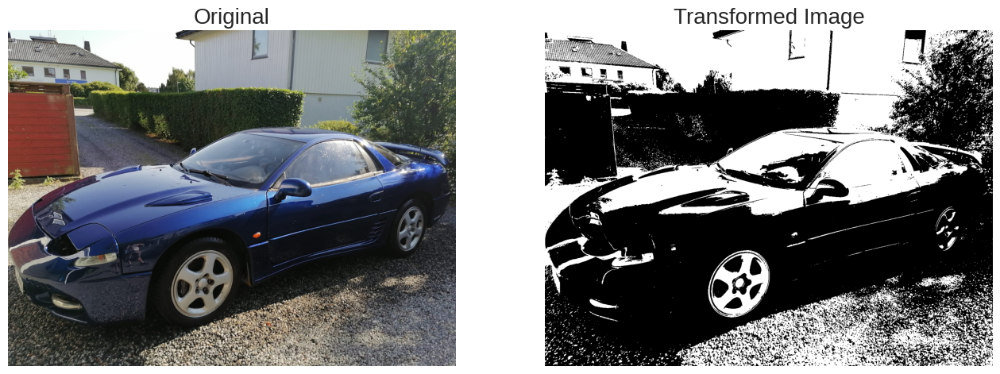

In [80]:
threshold = skimg_filt.threshold_otsu(gray)
otsu_image = gray > threshold

PlotSideBySide(image, otsu_image, "gray")

<h4> Local Tresholding </h4>

Often, images have brighter regions and darker ones. In this situation, a global treshold would not be the best option, but it's convenient to try to apply local ones.

Instead of looking at the whole image, local algorithms focus on pixel neighborhoods to account for the uneven brightness in different regions. A common local algorithm in skimage is given as $threshold\_local$ function:

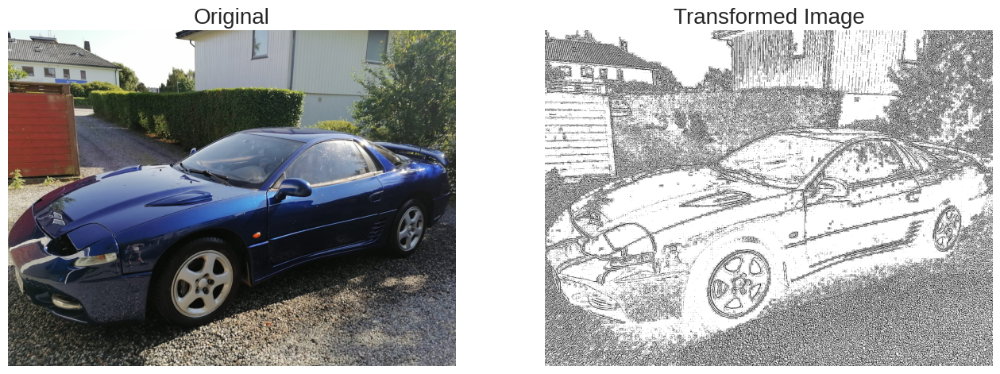

In [94]:
local_thresh = threshold_local(gray, block_size=3, offset=0.00025)

local_binary = gray > local_thresh

PlotSideBySide(image, local_binary, "gray")

as expected, we are now able to distinguish more clearly the borders of the car compared to the global treshold!

We can further improve the results by playing around with the $offset$ parameter, which is the constant subtracted from the mean of the local pixel neighborhood, and the $block\_size$ parameter which defined the lenght of the pixel to which the algorithm looks around when correcting the single pixels.

<h4> Edge detection </h4>

Edge detection can be used for identifying objects, extracting features from them, counting them etc. 

Following the [Tutorial](https://www.kaggle.com/code/bextuychiev/full-tutorial-on-image-processing-in-skimage/notebook), we will start with a basic Sobel filter, which finds edges of objects in gray scale images.

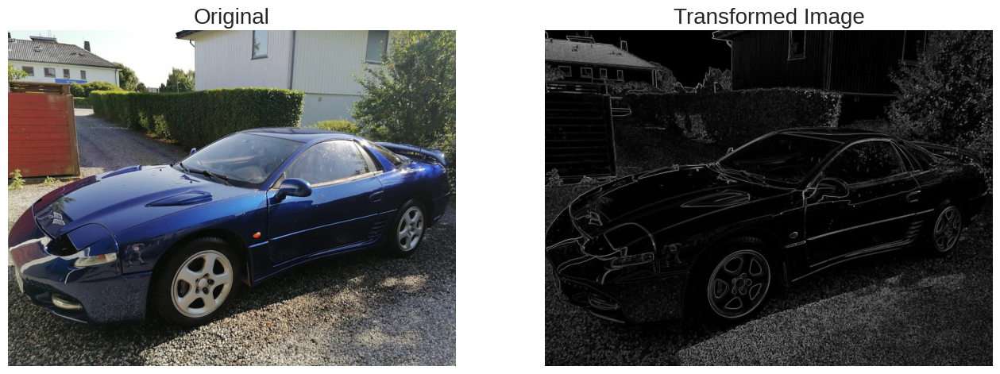

In [95]:
car_edge = skimg_filt.sobel(gray)

PlotSideBySide(image, car_edge, "gray")

<h4> Smoothing </h4>

Images could contain random noise with no useful information to ML and DL algorithms.This noise, may deviate the attention of ML models from the main objects themselves. In such scenarios, we use smoothing to blur the noise or edges and reduce contrast.

The most commonly used smoothing is the _Gaussian Smoothing_, which could be applied as follows:

/home/kuza91/anaconda3/lib/python3.8/site-packages/skimage/_shared/utils.py:348: RuntimeWarning: Images with dimensions (M, N, 3) are interpreted as 2D+RGB by default. Use `multichannel=False` to interpret as 3D image with last dimension of length 3.
  return func(*args, **kwargs)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


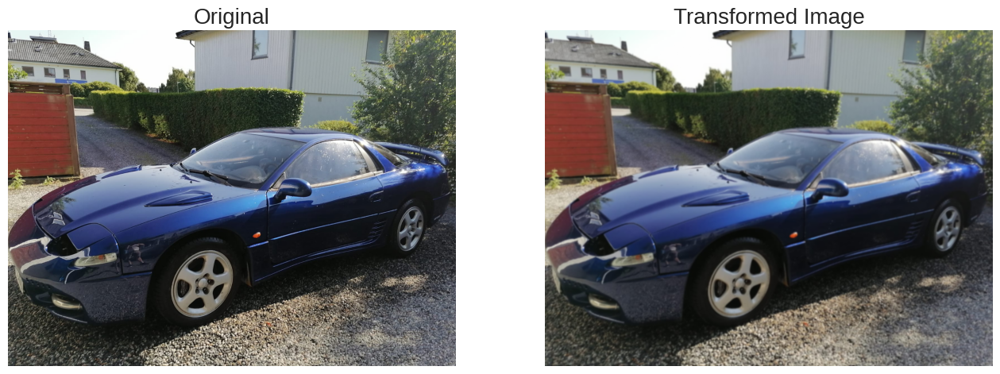

In [104]:
smoothed = skimg_filt.gaussian(image, sigma=2)

PlotSideBySide(image, smoothed, "viridis")

<h4> Contrast Enhancement </h4>

When we are just interested in the shapes of the image, we can grayscale that and increase the contrast to enhance its features.

This can be done either with:

- _Contrast stretching_
- _Histogram equalization_

Following the [Tutorial](https://www.kaggle.com/code/bextuychiev/full-tutorial-on-image-processing-in-skimage/notebook), we will focus on the second, which in turn is divided into:

- _Standard histogram equalization_
- _Adaptive histogram equalization_
- _Contrast Limited Adaptive Histogram Equalization (CLAHE)_

To begin, from the grayscaled image we can get the contrast as:

In [102]:
image.max() - image.min()

255

we can now apply the _Standard histogram equalization_ as:

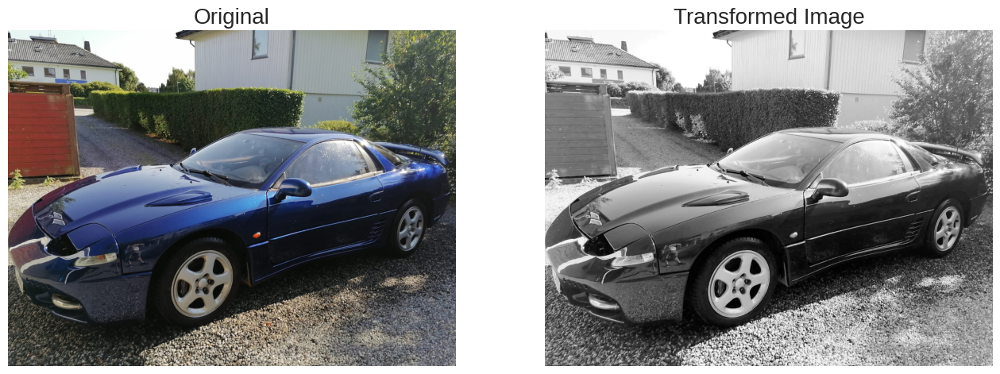

In [105]:
enhanced = equalize_hist(gray)

PlotSideBySide(image, enhanced, "gray")

the details of the image already appear more clearly!

If we try with the _CLAHE_ algorithm we obtain:

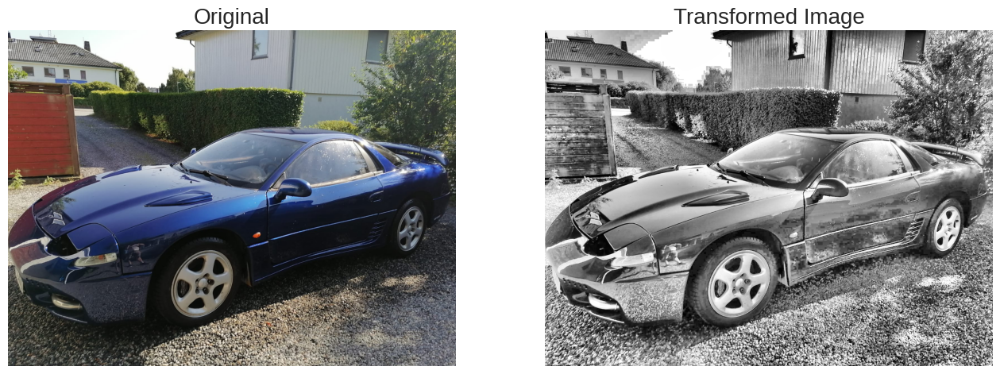

In [107]:
enhanced_adaptive = equalize_adapthist(gray, clip_limit=0.4) # Clip limit influence the amount of contrast increase

PlotSideBySide(image, enhanced_adaptive, "gray")